In [1]:
import numpy as np
from scipy.optimize import leastsq
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from scipy import special
import glob
plt.rcParams['figure.figsize'] = [13, 10]



In [2]:
def continuum(wl, fl, ctn_given, name, fe):
    plt.plot(wl, ctn_given, 'b-', label='Given Continuum')
    plt.step(wl, fl, 'g-', lw=2, where='mid', label='Data')
    wl0 = wl
    fl, wl, fe = trim(wl, fl, 2, np.mean(fl), fe) # first time through with threshold of 2 and mean as the reference 
    z = np.polyfit(wl, fl, 3)
    ctn = func(wl, z[0], z[1], z[2], z[3])
    for i in range(20):
        fl, wl, fe = trim(wl, fl, 1.75, ctn, fe) # include the new contunm into the trim funtion 
        z = np.polyfit(wl, fl, 3)
        ctn = func(wl, z[0], z[1], z[2], z[3])  
    for i in range(20):
        fl, wl, fe = trim(wl, fl, 1.4, ctn, fe) 
        z = np.polyfit(wl, fl, 3)
        ctn = func(wl, z[0], z[1], z[2], z[3])
    chi_string = 'Chi Squared = ' + str(Chi_sq(ctn, fl, fe))
    plt.plot(wl, fl, 'k-', label='Trimmed Data')
    plt.plot(wl0, func(wl0, z[0], z[1], z[2], z[3]), '-r', label='Fitted Continuum')
    plt.plot([], [], ' ', label=chi_string)
    plt.xlabel('Wavelength [A]')
    plt.ylabel('Flux')
    plt.title(name)
    plt.legend()
    plt.show()

def trim(wl, fl, threshold, reference, fe):
    flag = fl > reference - threshold*fe
    fl_new = fl[flag]
    wl_new = wl[flag]
    fe_new = fe[flag]
    return fl_new, wl_new, fe_new

def func(x, a, b, c, d):
    return a*x**3 + b*x**2 + c*x + d

def Chi_sq(model, data, error):
    return np.sum((model-data)**2 / error**2)

In [3]:
filenames = glob.glob('/Users/ryanlindley/Research/CIV/*')
CIV_targets = []
for f in filenames:
    CIV_targets.append(f.replace('/Users/ryanlindley/Research/CIV/', ''))

In [4]:
def plot_continuum(name):
    path = 'CIV/' + name + '/CIV.bin3.linespec'
    wl, fl, fe, ctn = np.loadtxt(path).transpose()
    continuum(wl, fl, ctn, name, fe)

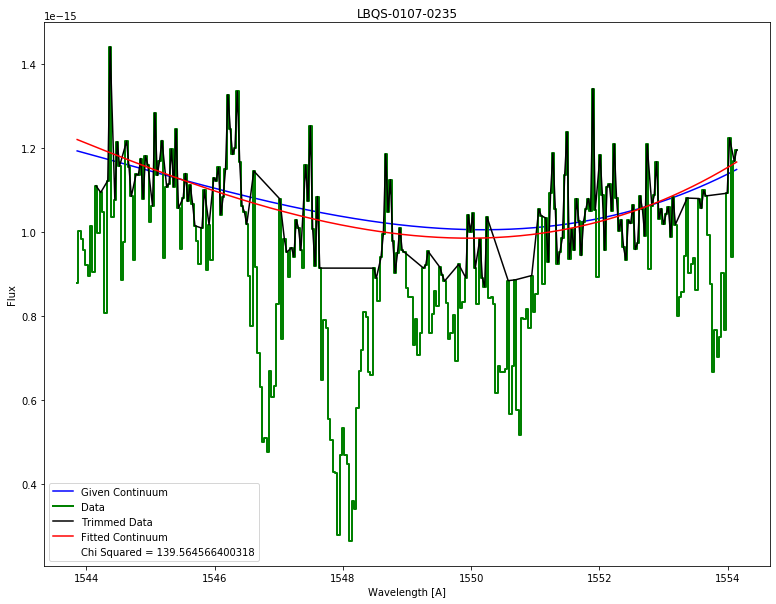

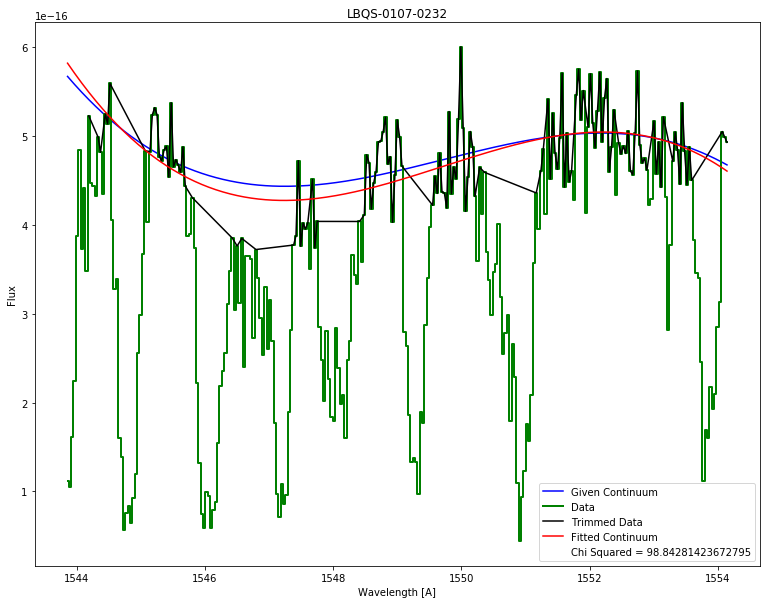

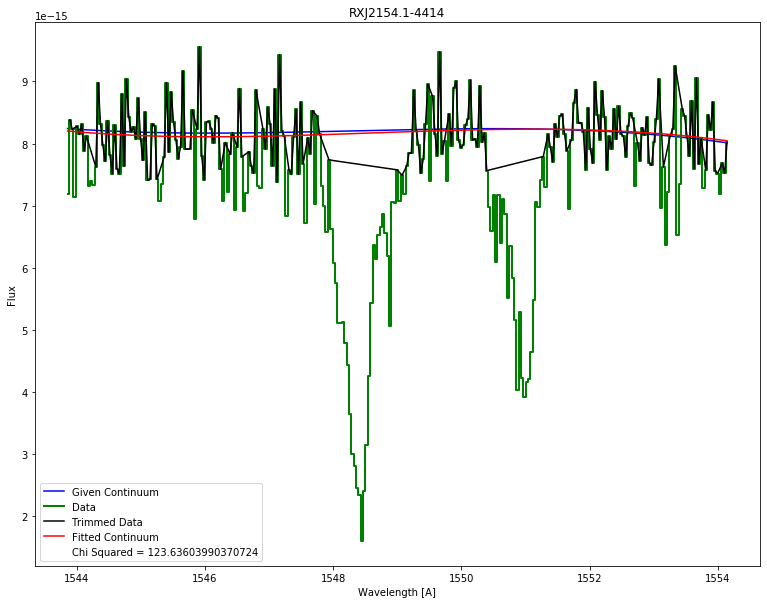

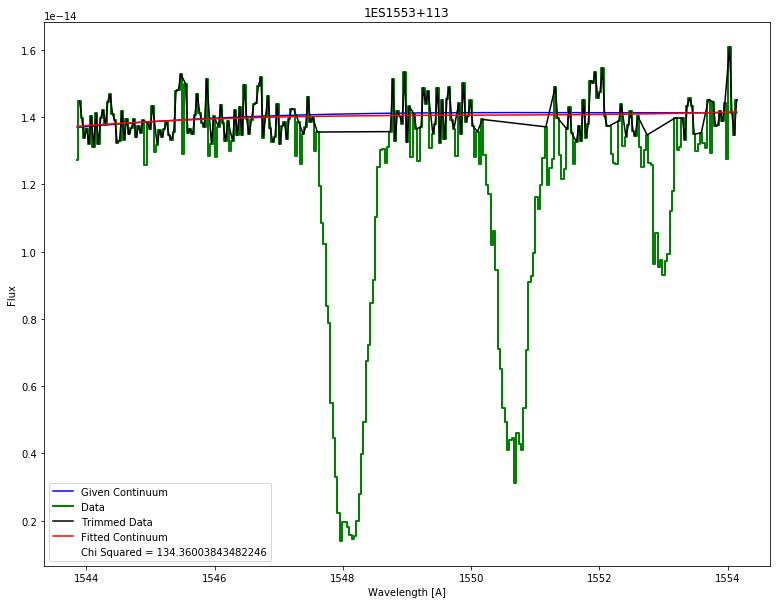

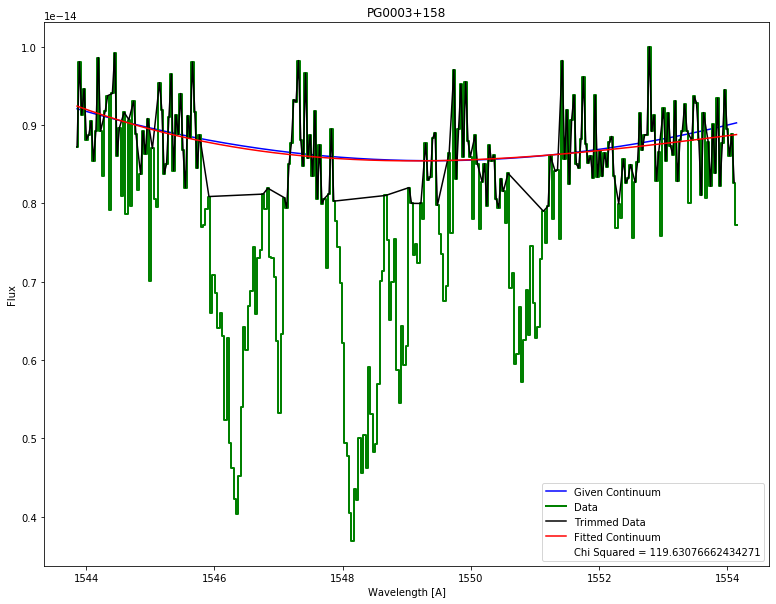

...

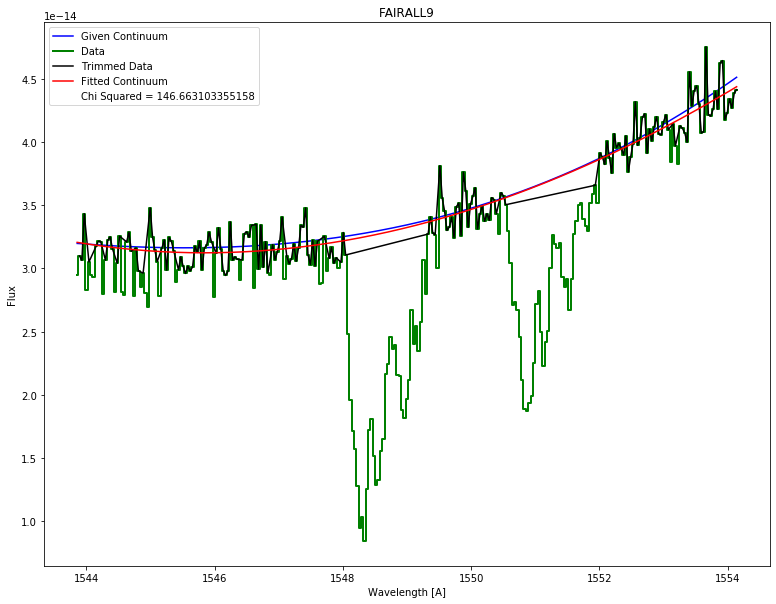

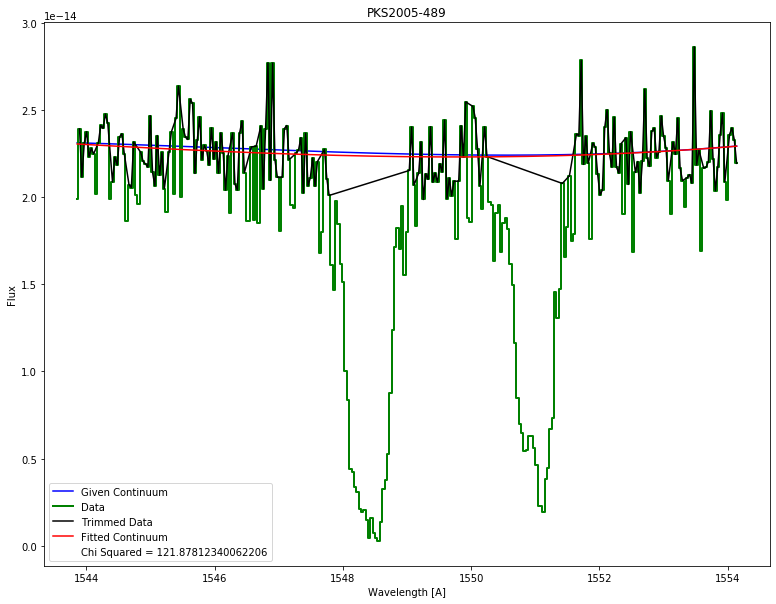

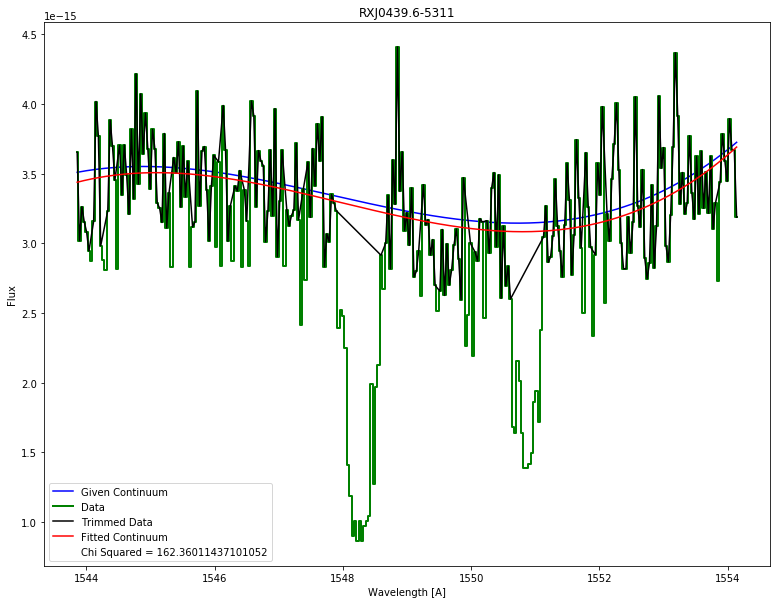

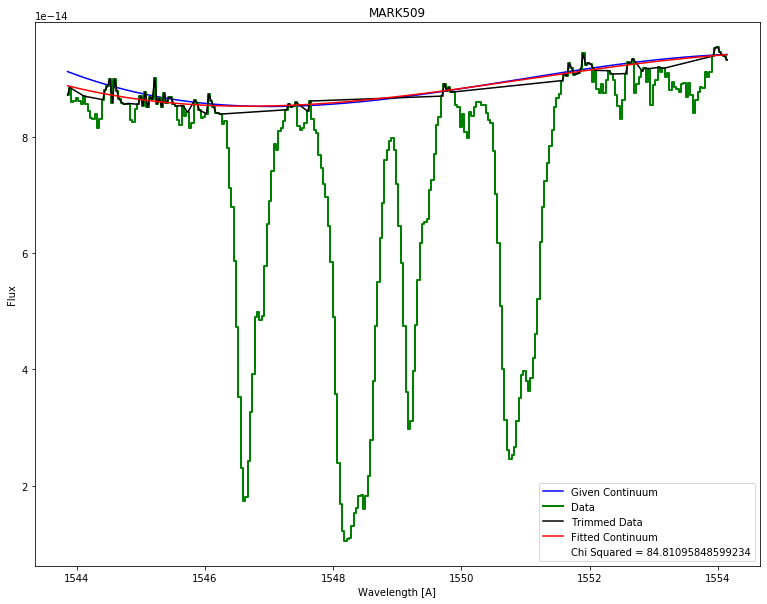

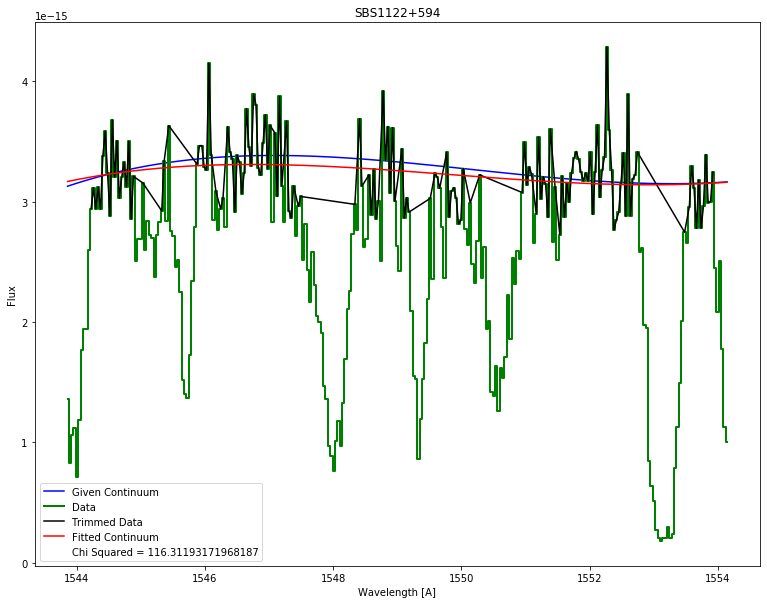

In [5]:
for t in CIV_targets:
    plot_continuum(t)
    
# calculte chi squared for my fit and actual data over - under + 